In [5]:
import sys
import os
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa
import glob

%matplotlib inline

plt.rcParams['figure.figsize'] = [8,8]

# Load Data

In [10]:
path = 'dataset'
path_imgs = list( map(lambda x: x.replace("dataset"+os.path.sep, ""), list(glob.glob(path+'/**/*.jpg'))))
labels = list(map(lambda x:os.path.split(os.path.split(x)[0])[1], path_imgs))
file_path = pd.Series(path_imgs, name='filepath').astype(str)
labels = pd.Series(labels, name='label')
df = pd.concat([file_path, labels], axis=1)
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,filepath,label
0,snow\1036.jpg,snow
1,dew\2524.jpg,dew
2,frost\4044.jpg,frost
3,rainbow\0758.jpg,rainbow
4,lightning\1941.jpg,lightning


In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# create datagenerators by calling flow_from_dataframe on them
path_to_images = r"dataset"
batch_size = 6
shuffle = False
target_size = (256, 256)

datagen = ImageDataGenerator()
generator = datagen.flow_from_dataframe(dataframe=df, directory=path_to_images,
                                        x_col="filepath", y_col="label", 
                                        batch_size=batch_size, shuffle=shuffle,
                                        class_mode="categorical", target_size=target_size, 
                                        color_mode="rgb", seed=42)

Found 6862 validated image filenames belonging to 11 classes.


In [14]:
batch = generator[0][0]

# Check Augmentations on Samples

In [32]:
def apply_augmentations_and_plot(batch, augmentation_func, batch_size=6):
    fig = plt.figure(figsize=(20, 10))
    nrows = 2
    ncols = int(batch_size / nrows)
    for i in range(batch_size):
        image = batch[i]
        plt.subplot(nrows, ncols, i+1)
        image = augmentation_func(image)
        plt.imshow(image.astype(np.uint8))
        plt.axis("off")
    plt.show()

## Add 

In [33]:
def add_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Add((60, 60))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

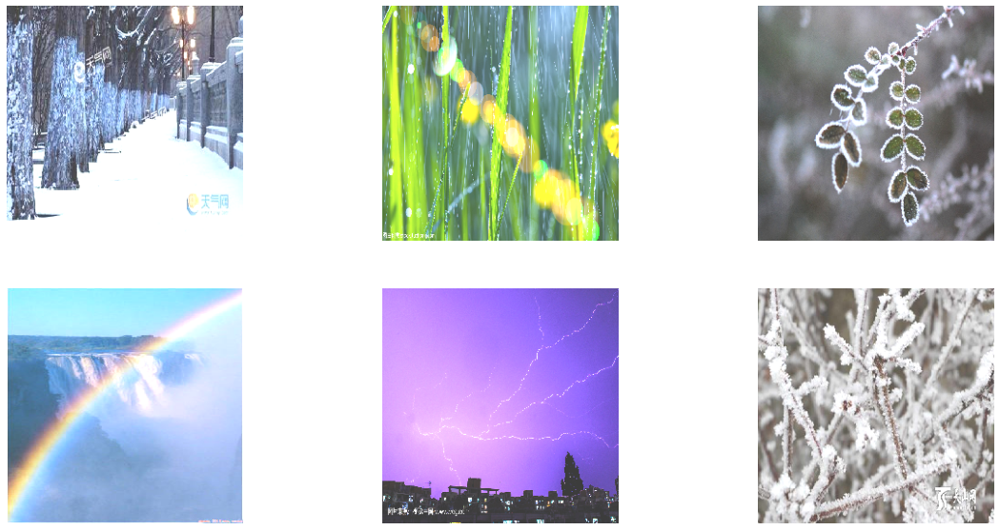

In [34]:
apply_augmentations_and_plot(batch, add_augmentation)

In [35]:
def add_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Add((-60, -60))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

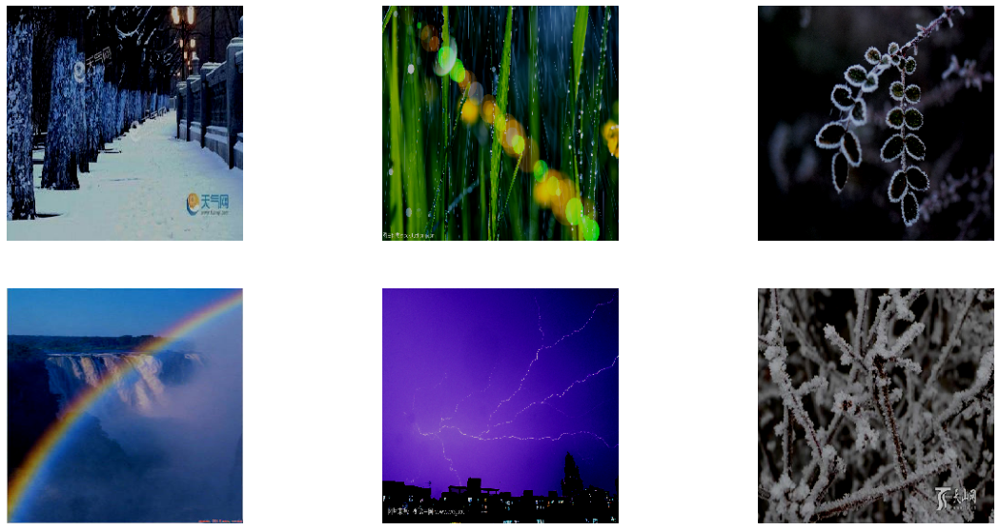

In [36]:
apply_augmentations_and_plot(batch, add_augmentation)

## Gaussian Noise

In [71]:
def gaussian_noise_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.AdditiveGaussianNoise(scale=(0, 0.2*255))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

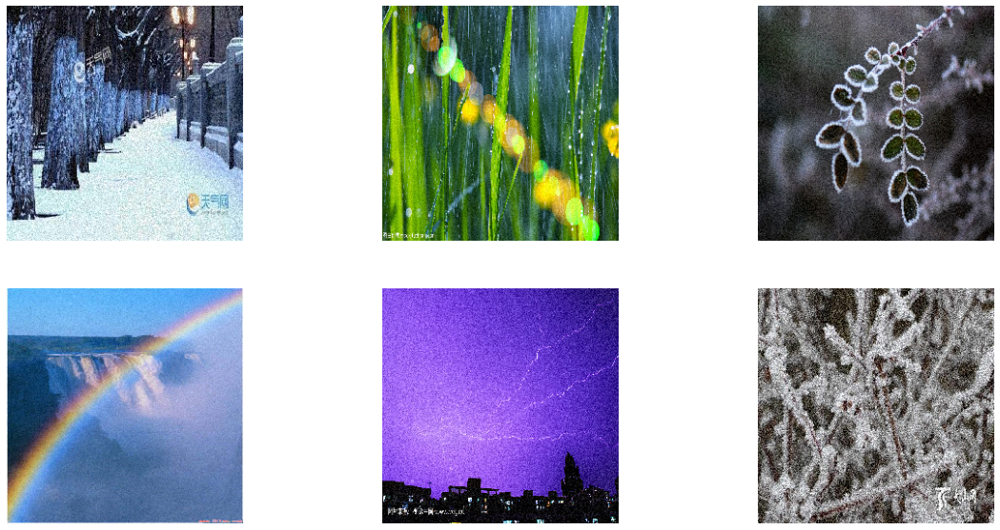

In [72]:
apply_augmentations_and_plot(batch, gaussian_noise_augmentation)

## Multiply

In [39]:
def multiply_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Multiply((1.6, 1.6))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

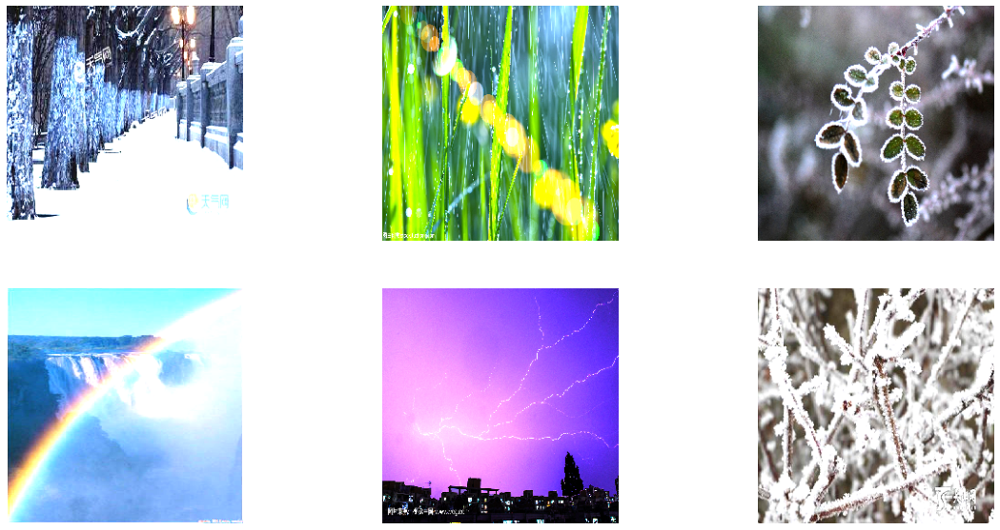

In [40]:
apply_augmentations_and_plot(batch, multiply_augmentation)

In [41]:
def multiply_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Multiply((0.5, 0.5))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

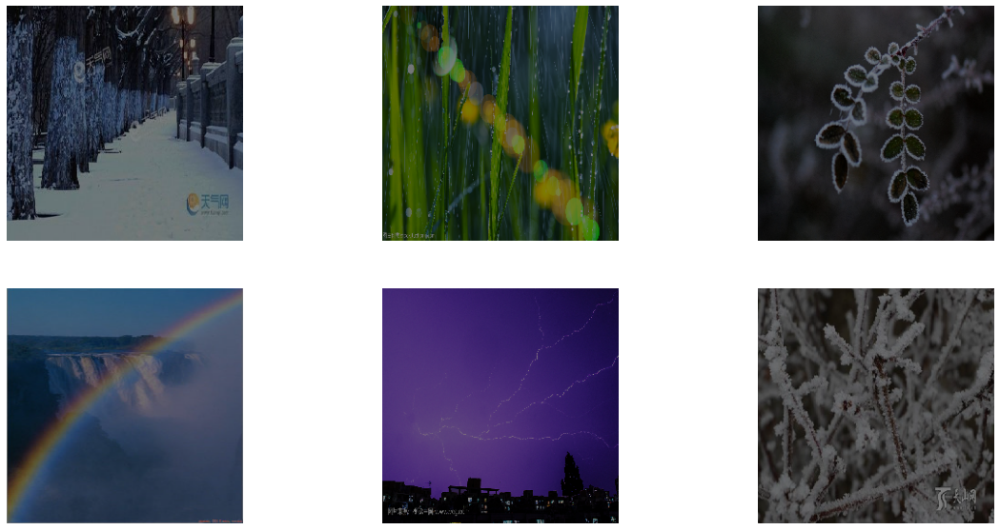

In [42]:
apply_augmentations_and_plot(batch, multiply_augmentation)

## Salt and Pepper

In [43]:
def salt_and_pepper_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.SaltAndPepper(0.1)
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

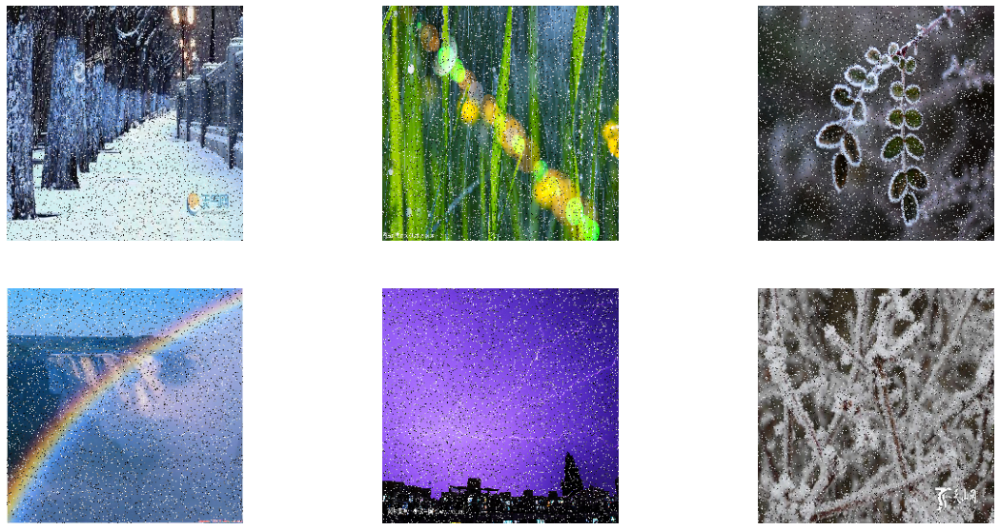

In [44]:
apply_augmentations_and_plot(batch, salt_and_pepper_augmentation)

## Gaussian Blur

In [45]:
def gaussian_blur_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.GaussianBlur(sigma=(2.0, 2.0))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

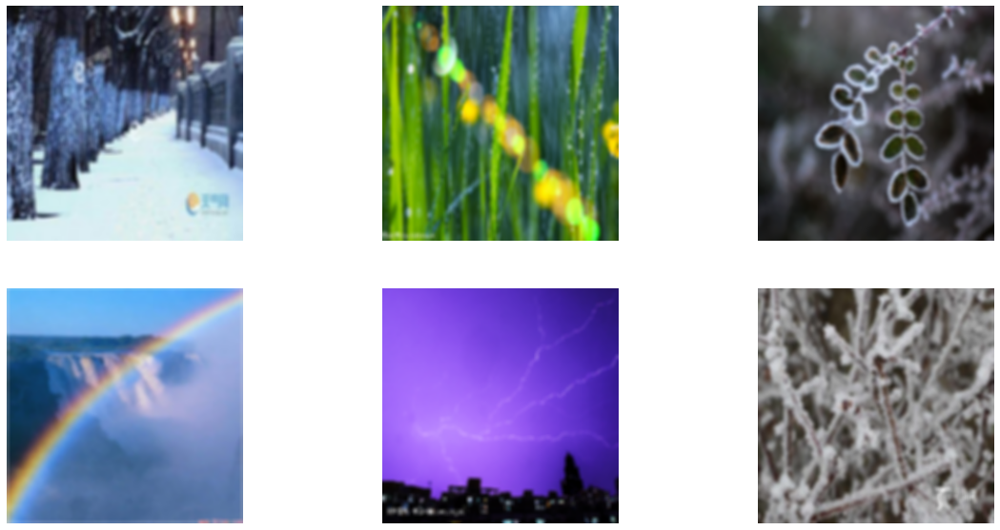

In [46]:
apply_augmentations_and_plot(batch, gaussian_blur_augmentation)

## Scaling

In [47]:
def scaling_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Affine(scale=(1.2, 1.2))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

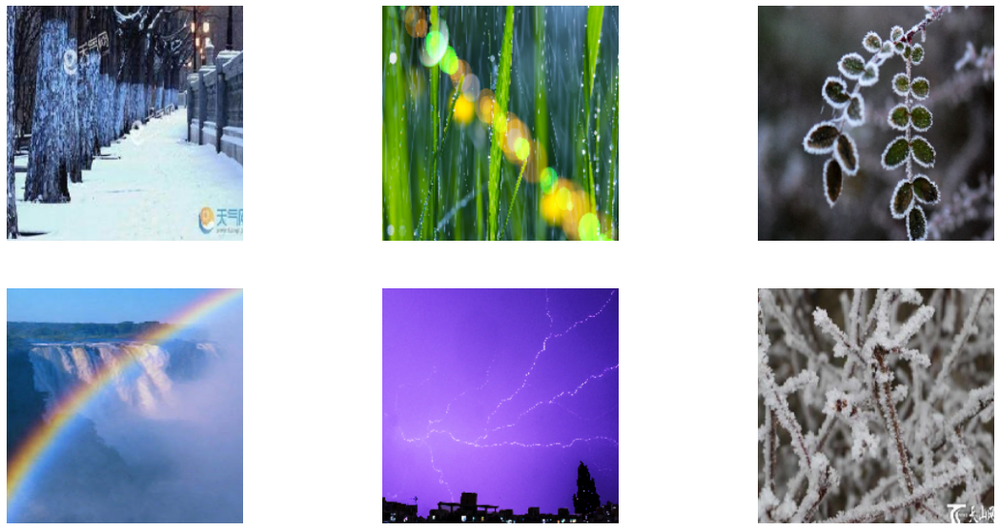

In [48]:
apply_augmentations_and_plot(batch, scaling_augmentation)

In [49]:
def scaling_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Affine(scale=(0.5, 0.5))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

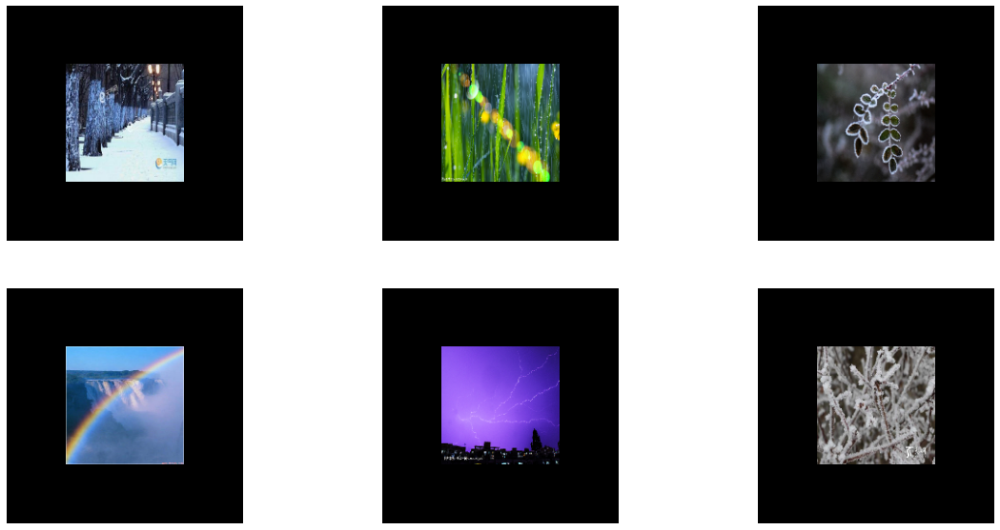

In [50]:
apply_augmentations_and_plot(batch, scaling_augmentation)

## Rotate

In [51]:
def rotate_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.Rotate((45, 45))
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

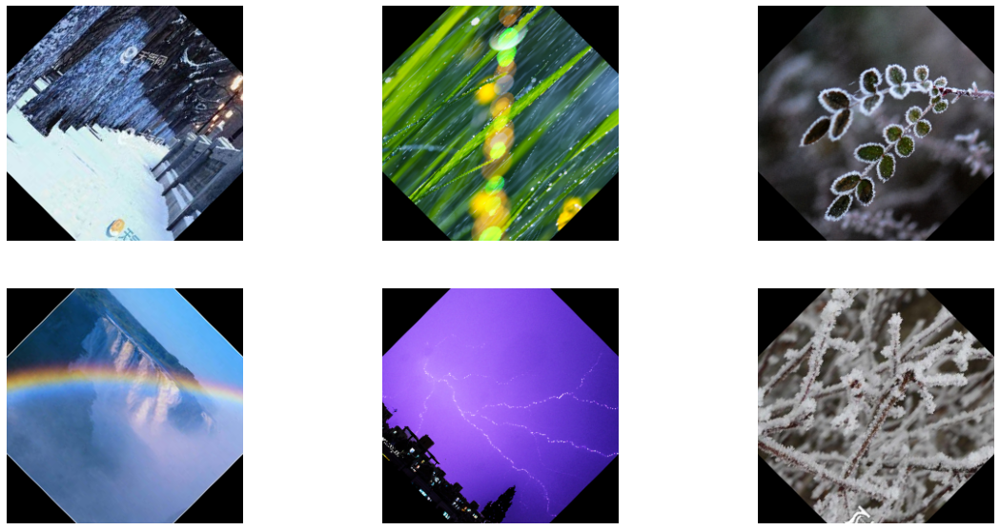

In [52]:
apply_augmentations_and_plot(batch, rotate_augmentation)

## Elastic Transformation

In [53]:
def elastic_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug = iaa.ElasticTransformation(alpha=(300.0, 300.0), sigma=25.0)
    
    # apply augmentation
    input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

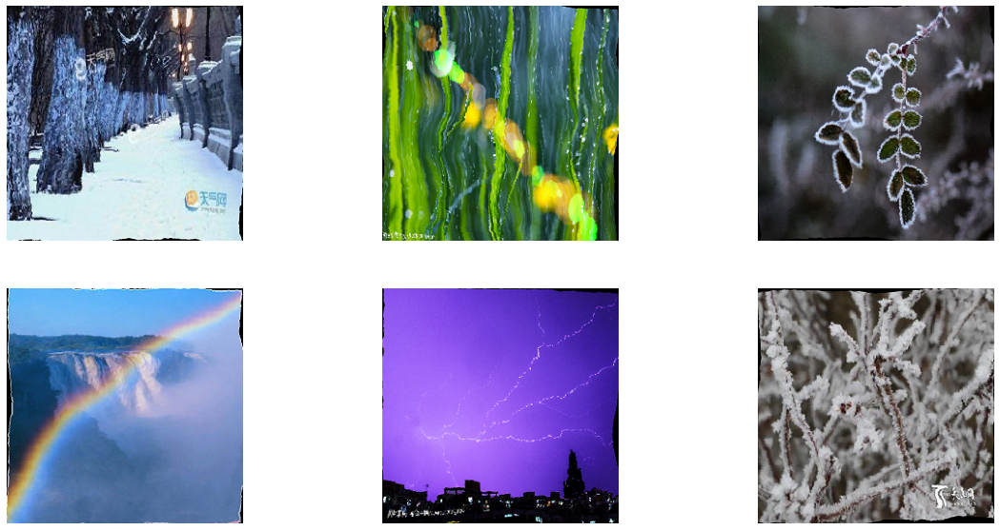

In [54]:
apply_augmentations_and_plot(batch, elastic_augmentation)

## Apply All

In [67]:
def apply_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug_list = [
                iaa.Fliplr(1.0),
                [iaa.Multiply((0.5, 1.5)), iaa.Add((-60, 60))],
                iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
                iaa.GaussianBlur(sigma=(0.5, 1.0)),
                iaa.Affine(scale=(0.5, 1.2)),
                iaa.Rotate((-45, 45)),
                iaa.ElasticTransformation(alpha=(50.0, 300.0), sigma=25.0),
              ]                
    for idx, aug in enumerate(aug_list):
        if isinstance(aug, list):
            rand_aug = np.random.randint(0, 2)
            input_image = np.clip(aug[rand_aug](images=input_image), 0., 255.)
        else:
            input_image = np.clip(aug(images=input_image), 0., 255.)

    return np.squeeze(input_image, axis=0)

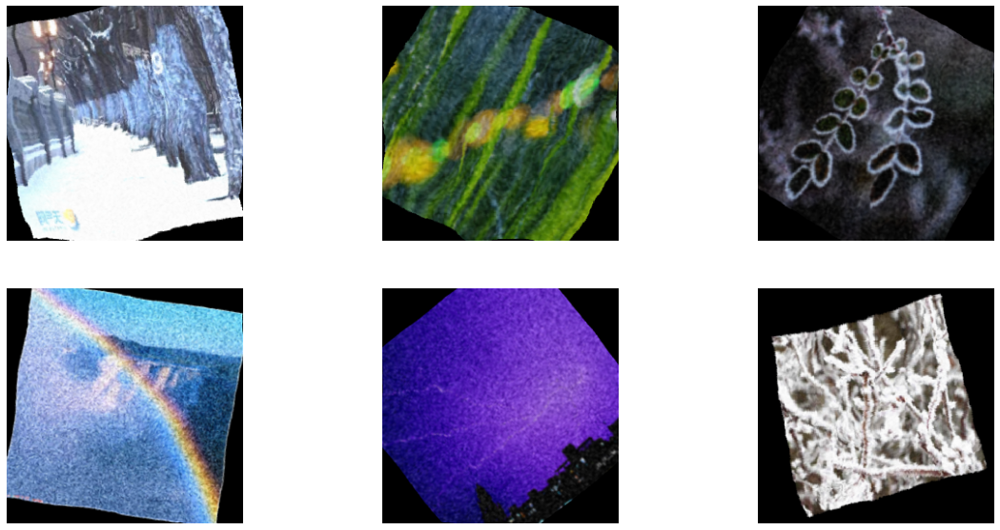

In [68]:
apply_augmentations_and_plot(batch, apply_augmentation)

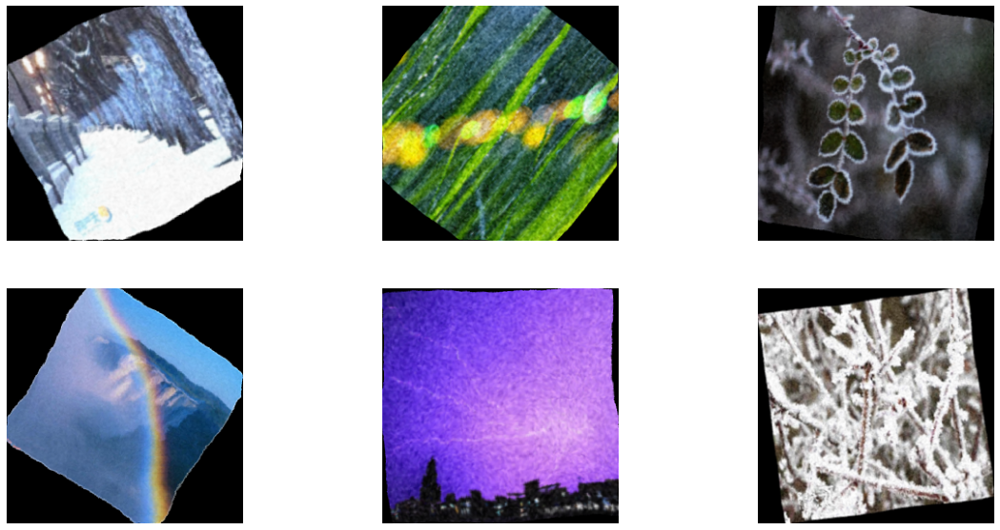

In [69]:
apply_augmentations_and_plot(batch, apply_augmentation)

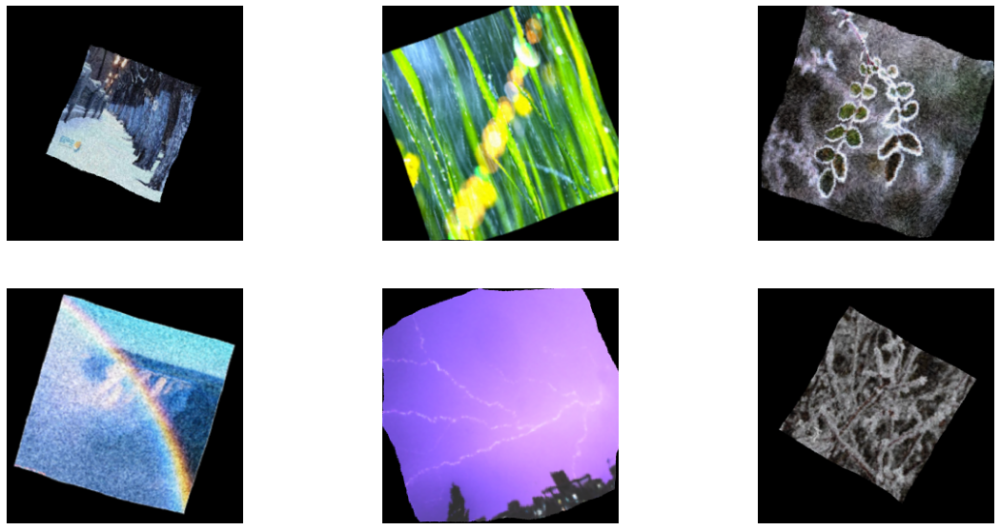

In [70]:
apply_augmentations_and_plot(batch, apply_augmentation)

## Apply all with certain Probability

In [73]:
def apply_augmentation(input_image):
    input_image = np.expand_dims(input_image, axis=0)
    aug_list = [
                iaa.Fliplr(1.0),
                [iaa.Multiply((0.5, 1.5)), iaa.Add((-60, 60))],
                iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
                iaa.GaussianBlur(sigma=(0.5, 1.0)),
                iaa.Affine(scale=(0.5, 1.2)),
                iaa.Rotate((-45, 45)),
                iaa.ElasticTransformation(alpha=(50.0, 300.0), sigma=25.0),
              ]                
    for idx, aug in enumerate(aug_list):
        # only apply augmentation such that in total 10% of the images are not augmented
        # P_single_aug = 1 - exp((1/N) * ln(P_not_aug)) ~ 0.28
        rand_nr = np.random.rand()
        threshold = 0.28
        if isinstance(aug, list):
            rand_aug = np.random.randint(0, 2)
            input_image = np.clip(aug[rand_aug](images=input_image), 0., 255.) if rand_nr <= threshold else input_image
        else:
            input_image = np.clip(aug(images=input_image), 0., 255.) if rand_nr <= threshold else input_image

    return np.squeeze(input_image, axis=0)

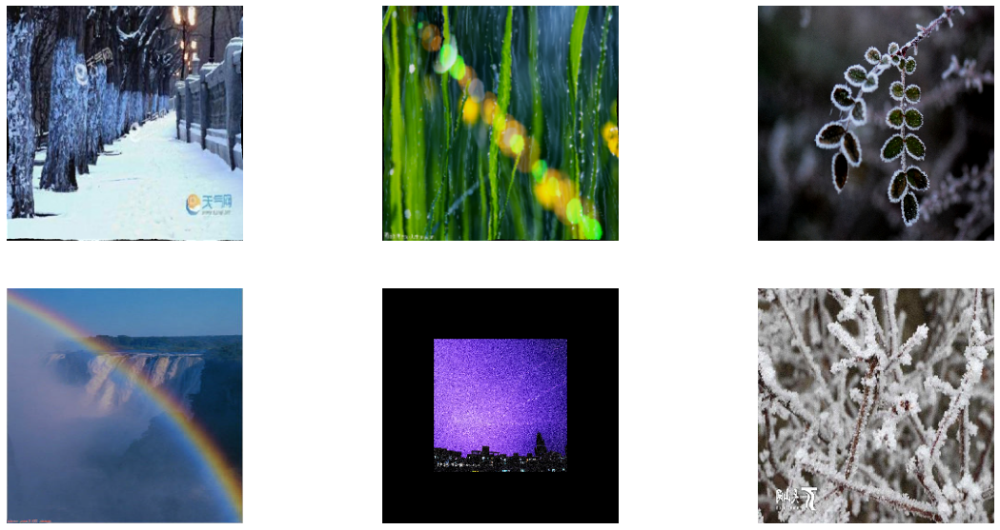

In [74]:
apply_augmentations_and_plot(batch, apply_augmentation)

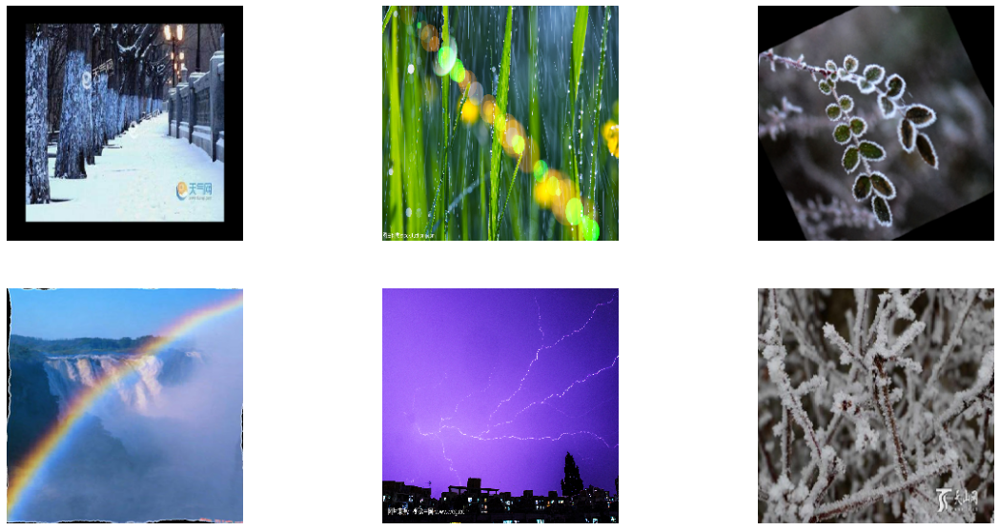

In [75]:
apply_augmentations_and_plot(batch, apply_augmentation)

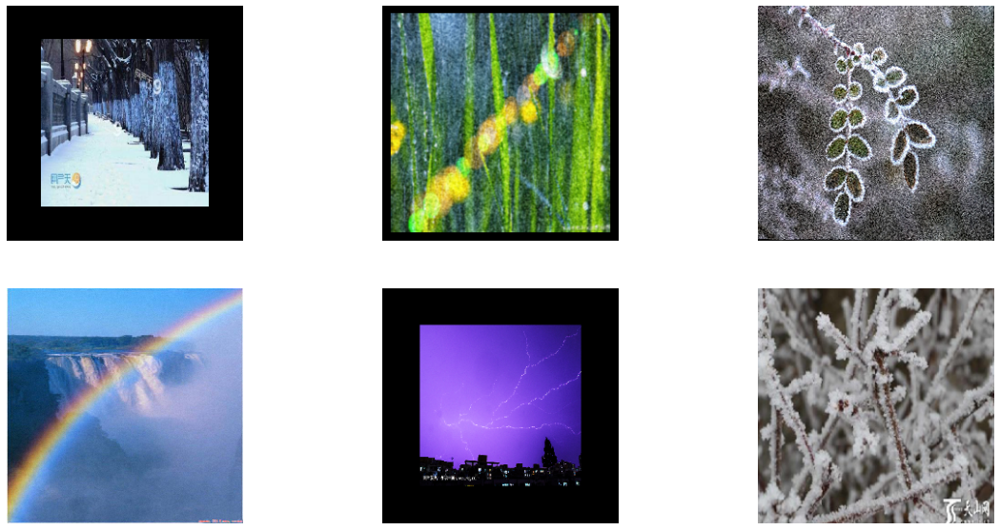

In [76]:
apply_augmentations_and_plot(batch, apply_augmentation)